# Input Output Tests with Extended Waveset
To verify whether or not our amplitude model can handle higher order $J^P \ell$ partial waves, we can try fitting a Monte Carlo dataset that only contains a $b_1(1235)$ and $\rho(1450)$ (which we know previously to appear in the $S_0^{(+)}$ and $P_1^{(+)}$ partial waves). We of course then expect all other partial waves to be near 0. 

This procedure is better understood by employing a "bootstrapping" method. Once we have obtained the nominal fit parameters from performing repeated randomized fits, we perform another 100 fits all starting at the nominal fit parameters. Each bootstrap fit randomly samples the original dataset with replacement, and in doing so we can plot the distribution of those 100 fits for each fit parameter to get an estimate of its error. 

TODO:
* Bootstrap fits in a single bin can be compared across wavesets. So I can use the `hues` keyword to compare the distribution of fit results between the $J^P=\{0^-,1^+,1^-\}$ and $J^P=\{0^-,1^+,1^-,2^+\}$ dataset. I can also color the *nominal* and *generated* values by their hue colors

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math

from pathlib import Path    
import sys, os
parent_dir = str(Path().resolve().parents[1])
sys.path.insert(0, parent_dir)
import analysis.scripts.pwa_tools as pwa_tools

# change some plot parameters to look better
plt.rcParams["figure.figsize"] = (10, 8)
plt.rcParams["figure.dpi"] = 500
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["legend.fontsize"] = 16
plt.rcParams["xtick.major.width"] = 2.0
plt.rcParams["xtick.minor.width"] = 1.8
plt.rcParams["ytick.major.width"] = 2.0
plt.rcParams["ytick.minor.width"] = 1.8
plt.rcParams["lines.markersize"] = 12

## Prepare Data

In [2]:
# loop over all csv's and collect them into 2 lists
path = f"{parent_dir}/analysis/data/io_extended_waveset_test"
csv_files = [f for f in os.listdir(path) if f.endswith(".csv")]

df_list = []
df_bootstrap_list = []
df_data_list = []

for csv in csv_files:    
    if "data" in csv:
        print(f"Adding data df:\t{csv}")                
        df_data = pd.read_csv(f"{path}/{csv}")        
        df_data_list.append(df_data)
    elif "bootstrap" in csv:
        print(f"Adding bootstrap df:\t{csv}")
        df_bootstrap = pd.read_csv(f"{path}/{csv}")
        df_bootstrap_list.append(df_bootstrap)
    else:
        print(f"Adding fit df:\t{csv}")
        df = pd.read_csv(f"{path}/{csv}", index_col="index")        
        pwa_tools.wrap_phases(df)
        df_list.append(df)

df = pd.concat(df_list)
df_data = pd.concat(df_data_list)
df_bootstrap = pd.concat(df_bootstrap_list)

df_bootstrap["bin"] = 0 
df_bootstrap["bin"].astype("int8")

MASS_BINS = df_data["mean"]
bin_width = (df_data["high_edge"] - df_data["low_edge"])[0]
coherent_sums = pwa_tools.get_coherent_sums(df)
phase_differences = pwa_tools.get_phase_differences(df)

Adding data df:	data.csv
Adding bootstrap df:	bootstrap.csv
Adding fit df:	best.csv


## Analysis

### Standard Plots
i.e. plots available via the pwa_tools.Plotter class

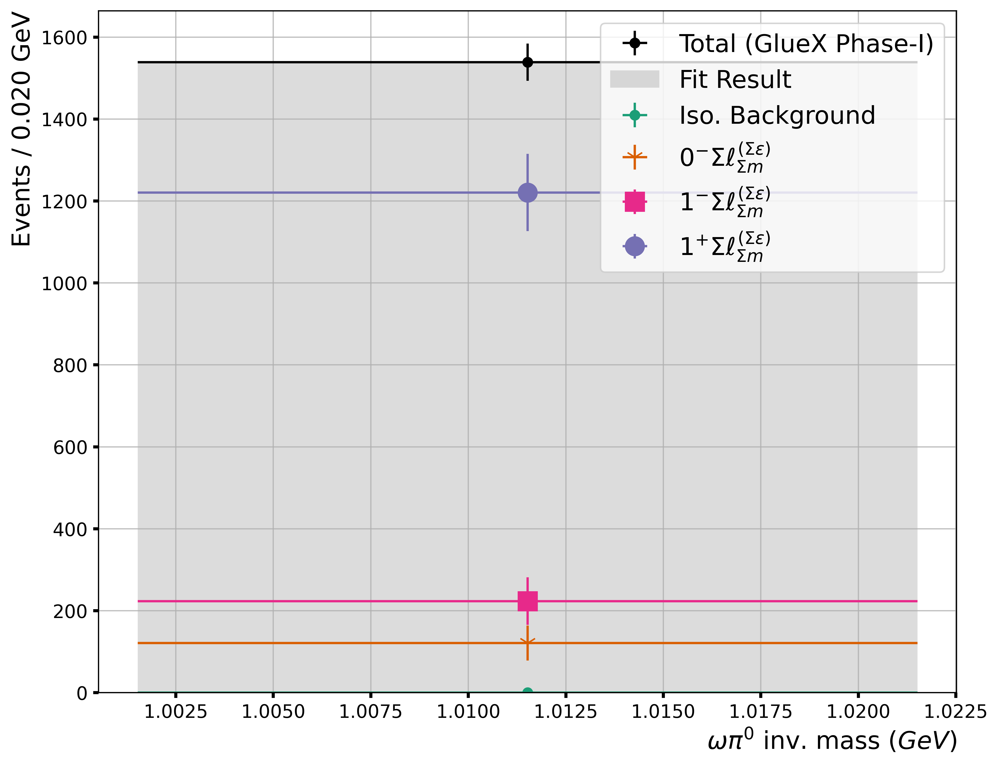

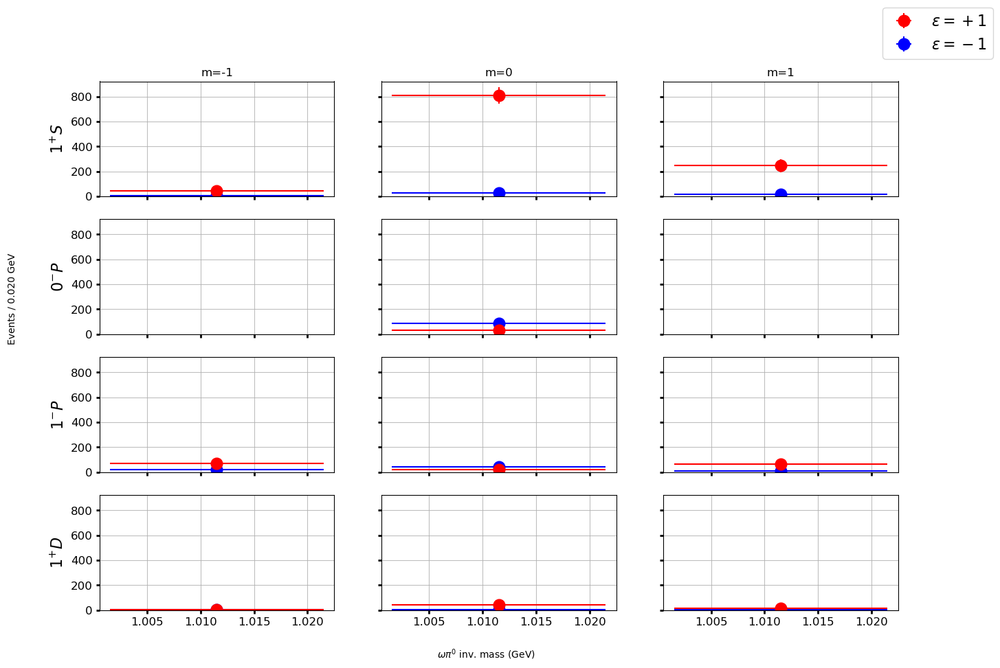

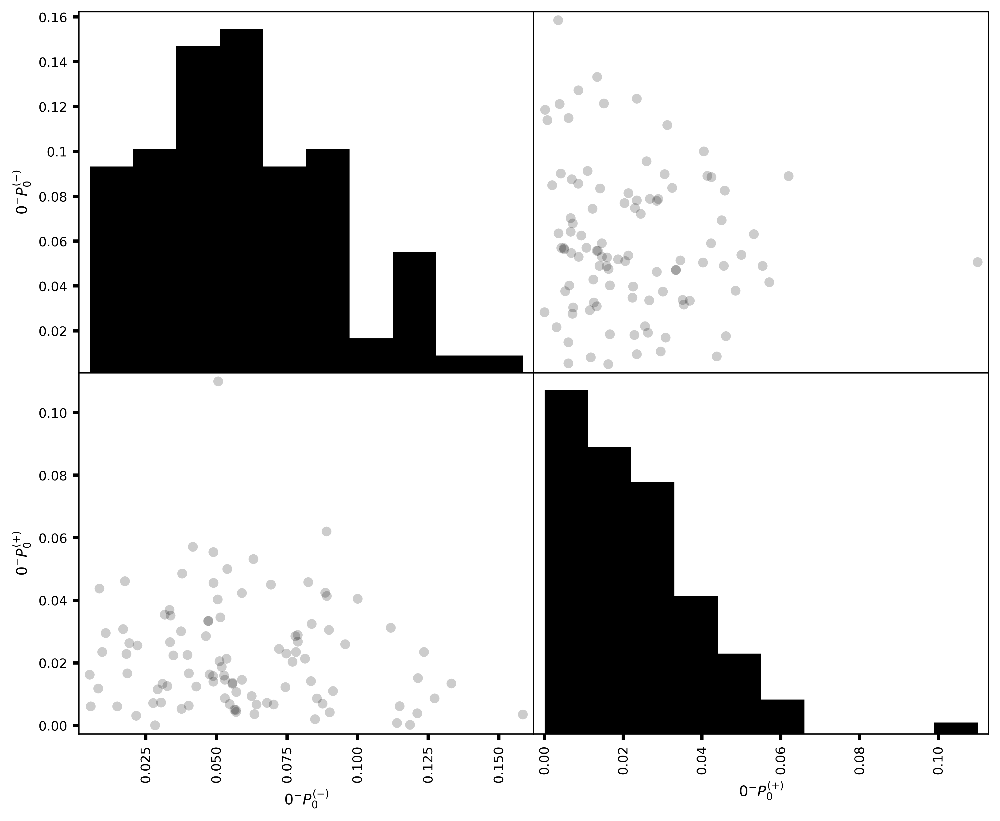

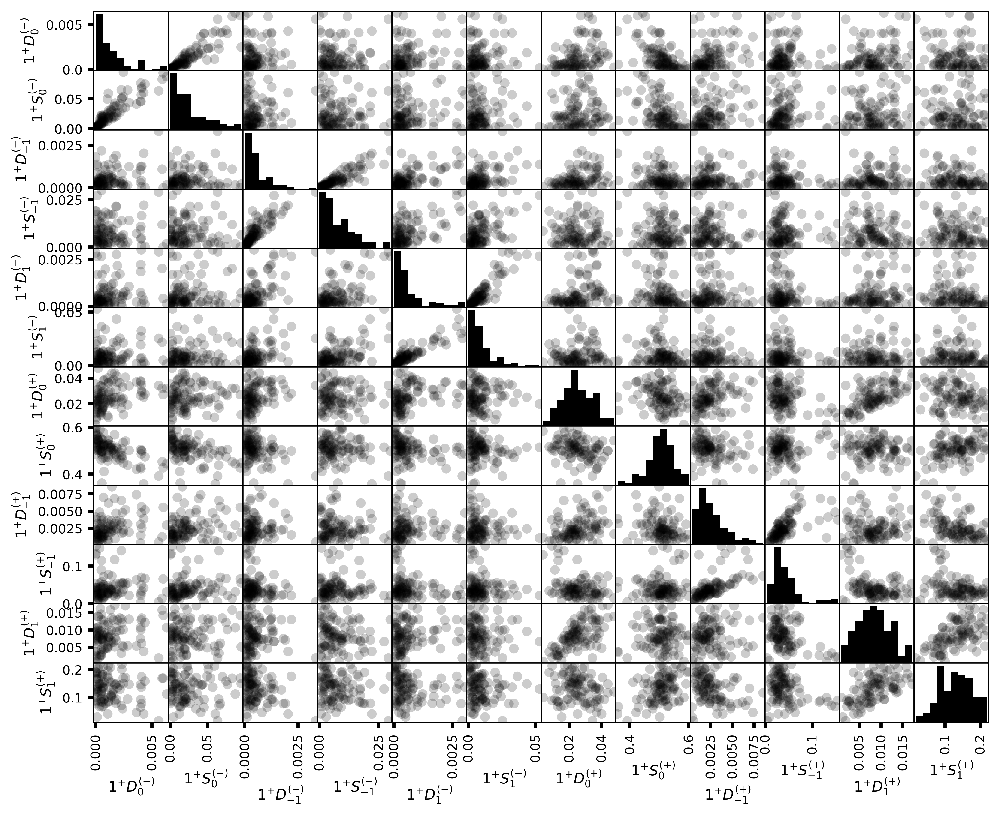

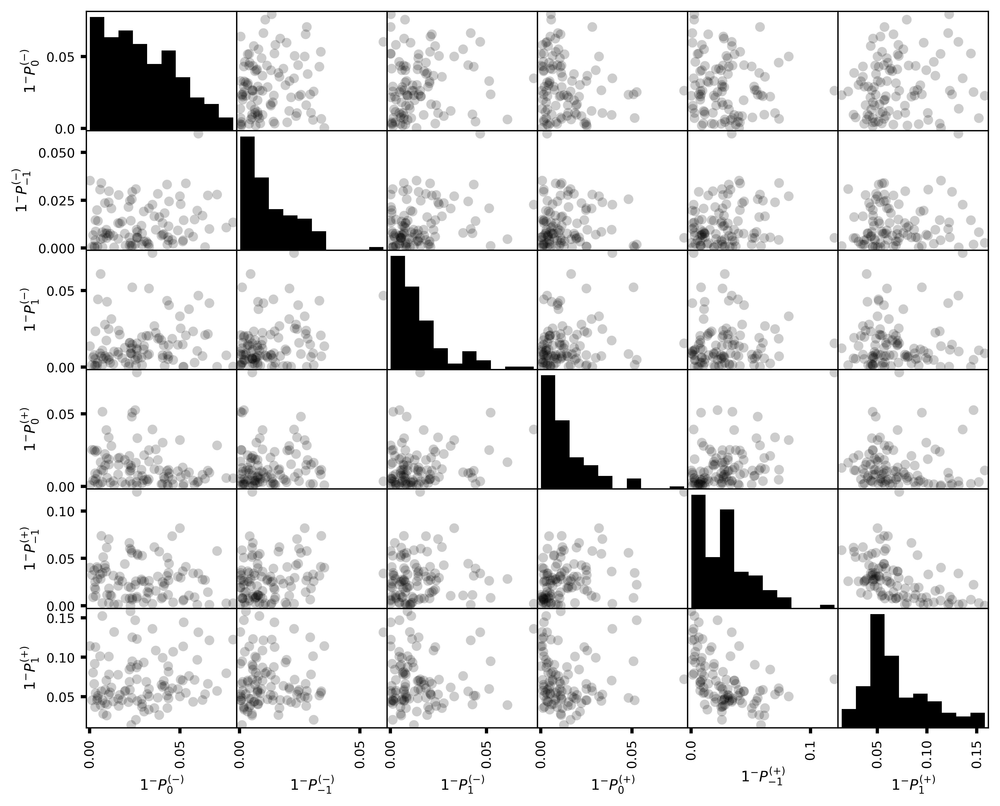

In [3]:
plotter = pwa_tools.Plotter(df, df_data, df_bootstrap)

plotter.jp()
plotter.intensities()
coherent_sums = plotter._coherent_sums
plotter.bootstrap_matrix(0, [x for x in coherent_sums["eJPmL"] if x[1:3]=="0m"], 
                         color="black", hist_kwds={"color":"black"})
plotter.bootstrap_matrix(0, [x for x in coherent_sums["eJPmL"] if x[1:3]=="1p"],
                         color="black", hist_kwds={"color":"black"})
plotter.bootstrap_matrix(0, [x for x in coherent_sums["eJPmL"] if x[1:3]=="1m"],
                         color="black", hist_kwds={"color":"black"})

### Other Plots
Unique ones we make ourselves

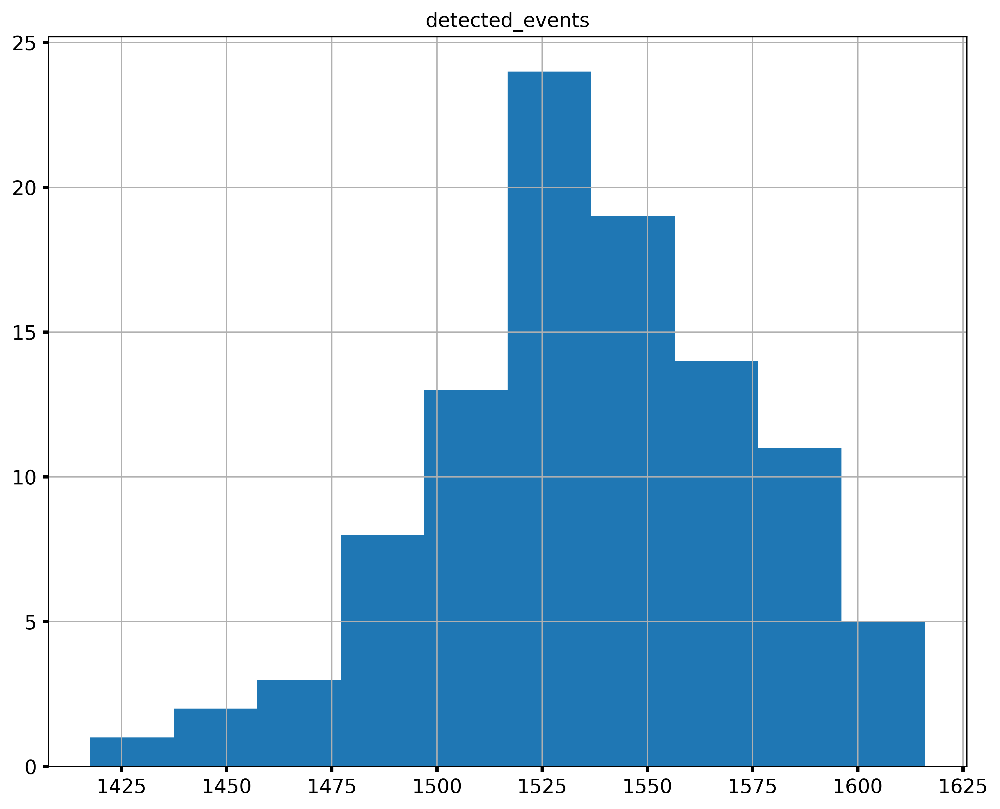

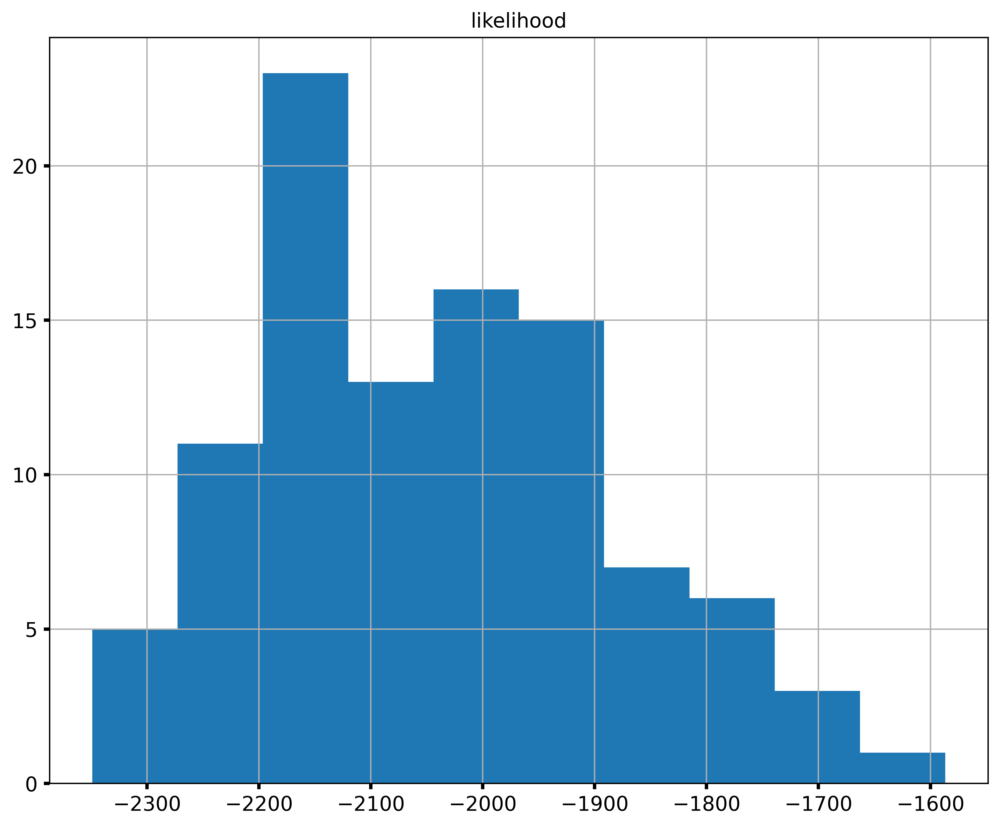

In [10]:
# distribution of likelihood and detected_events 
df_bootstrap.hist("detected_events")
plt.show()
df_bootstrap.hist("likelihood")
plt.show()

In [19]:
import seaborn as sns


columns = [x for x in coherent_sums["eJPmL"] if x[1:3]=="1m"]
temp_df = df_bootstrap[df_bootstrap["bin"]==0][columns].div(df_bootstrap["detected_events"], axis="index")

pg = sns.PairGrid(temp_df)
pg.map_diag(sns.histplot, kde=True)
pg.map_upper(sns.kdeplot, levels=[0.003, 0.05, 0.32])
pg.map_lower(sns.scatterplot)
num_plots = len(columns)

# do all operations on axes first, then change the labels afterwards
for row in range(num_plots):
    for col in range(num_plots):
        col_label = pg.axes[num_plots-1,col].xaxis.get_label().get_text()
        row_label = pg.axes[row,0].yaxis.get_label().get_text()

        # draw green lines for nominal fit values        
        pg.axes[row, col].axvline(
            x=df.loc[0][col_label] / df.loc[0]["detected_events"], 
            color="green",            
            linestyle="-",
            linewidth=2.0,
        )  
        pg.axes[row, col].axvspan(
            xmin=(df.loc[0][col_label] - df.loc[0][col_label+"_err"]/2)/ df.loc[0]["detected_events"], 
            xmax=(df.loc[0][col_label] + df.loc[0][col_label+"_err"]/2)/ df.loc[0]["detected_events"],
            color="green",            
            alpha=0.2
        )  
        if row!=col:
            pg.axes[row,col].axhline(
                y=df.loc[0][row_label] / df.loc[0]["detected_events"],
                color="green",                
                linestyle="-",
                linewidth=2.0
            )
            pg.axes[row,col].axhspan(
                ymin=(df.loc[0][row_label] - df.loc[0][row_label+"_err"]/2)/ df.loc[0]["detected_events"],
                ymax=(df.loc[0][row_label] + df.loc[0][row_label+"_err"]/2)/ df.loc[0]["detected_events"],
                color="green",
                alpha=0.2
            )
            # draw black box around plot if its correlation is above |0.7|
            corr = temp_df[[col_label, row_label]].corr().iat[0,1]
            if np.abs(corr) > 0.7:                
                pg.axes[row,col].patch.set_edgecolor("black")
                pg.axes[row,col].patch.set_linewidth(3)
        # annotate plot with ratio between MINUIT error and bootstrap standard dev
        if row==col:            
            ratio = df.loc[0][col_label+"_err"] / df_bootstrap[df_bootstrap["bin"]==0][col_label].std()
            pg.axes[row,col].text(0.6,0.9, rf"$\frac{{\sigma_{{MINUIT}}}}{{\sigma_{{bootstrap}}}}$ = {ratio:.2f}", transform=pg.axes[row,col].transAxes)

for row in range(num_plots):
    for col in range(num_plots):             
        x_label = pg.axes[row,col].xaxis.get_label().get_text()
        y_label = pg.axes[row,col].yaxis.get_label().get_text()

        fontsize = pg.axes[row,col].xaxis.get_label().get_fontsize()
        
        pg.axes[row,col].set_xlabel(pwa_tools.convert_amp_name(x_label), fontsize=fontsize)
        pg.axes[row,col].set_ylabel(pwa_tools.convert_amp_name(y_label), fontsize=fontsize)   

plt.show()

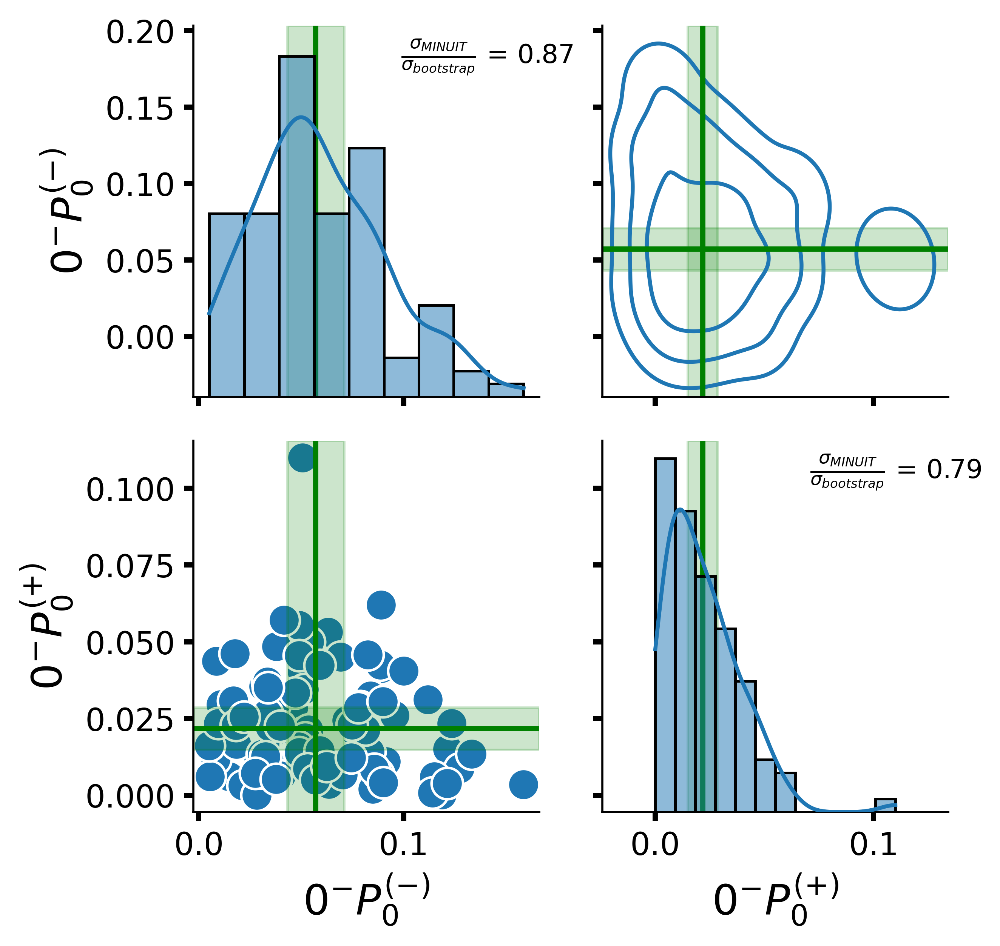

In [4]:
# tester for pwa_plotter's pairplot
plotter = pwa_tools.Plotter(df, df_data, df_bootstrap)
columns = [x for x in coherent_sums["eJPmL"] if x[1:3]=="0m"]
plotter.bootstrap_matrix(0, columns)